# Training the Redness Classification uisng 3 pretrianed models

## 1-Preparing The Dataset and creating albumentations

In [1]:
#pip install -U albumentations

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 290.6/290.6 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 632.7/632.7 kB 25.0 MB/s eta 0:00:00
  Attempting uninstall: albucore
    Found existing installation: albucore 0.0.19
    Uninstalling albucore-0.0.19:
      Successfully uninstalled albucore-0.0.19
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.4.20
    Uninstalling albumentations-1.4.20:
      Successfully uninstalled albumentations-1.4.20
Note: you may need to restart the kernel to use updated packages.


Import Required Libraries 

In [10]:
import os
import cv2
import numpy as np
import shutil
import random
import torch
import torchvision
import albumentations as A
from albumentations.pytorch import ToTensorV2
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, Dataset, WeightedRandomSampler
import torch.nn as nn
import torch.optim as optim
import timm
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

## Enable GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


## 2-Verify Dataset Structure

In [15]:
# Define dataset paths
dataset_path = "/kaggle/input/redness1"
augmented_dataset_path = "/kaggle/working/augmented_redness"

# Ensure the dataset has the right folders
expected_classes = ["Normal", "Abnormal"]

for cls in expected_classes:
    cls_path = os.path.join(dataset_path, cls)
    if not os.path.exists(cls_path):
        raise FileNotFoundError(f"⚠️ {cls} class folder not found → {cls_path}")
    print(f"✅ Found class folder: {cls_path}")

# List class subdirectories in Abnormal
abnormal_path = os.path.join(dataset_path, "Abnormal")
print("\n📂 Subfolders inside Abnormal:")
for subfolder in os.listdir(abnormal_path):
    print(f"   📁 {subfolder}")


✅ Found class folder: /kaggle/input/redness1/Normal
✅ Found class folder: /kaggle/input/redness1/Abnormal

📂 Subfolders inside Abnormal:
   📁 Bulbar conjunctival redness
   📁 palpebral conjunctiva redness
   📁 Sub conjunctival hemorhage


the Smallest Image in the Dataset

In [16]:
min_height, min_width = float('inf'), float('inf')

for cls in expected_classes:
    cls_path = os.path.join(dataset_path, cls)
    
    for root, _, files in os.walk(cls_path):
        for file in files:
            img_path = os.path.join(root, file)
            img = cv2.imread(img_path)
            
            if img is None:
                print(f"⚠️ Skipping corrupted file: {img_path}")
                continue
            
            h, w = img.shape[:2]
            min_height = min(min_height, h)
            min_width = min(min_width, w)

print(f"✅ Smallest image found: {min_height}x{min_width}")


✅ Smallest image found: 41x41


Augmentations

In [17]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import transforms

# ✅ Correct Dataset Path
DATASET_PATH = "/kaggle/input/eyeredness/Redness"
AUGMENTED_DATASET_PATH = "/kaggle/working/augmented_redness"

# ✅ Define Class Folders
CATEGORIES = ["Normal", "Abnormal"]
SUBCATEGORIES = {
    "Abnormal": ["Bulbar conjunctival redness", "Sub conjunctival hemorhage", "Palpebral conjunctiva redness"]
}

# ✅ Define Augmentations
augmentations = {
    "rotation": transforms.RandomRotation(degrees=(30, 360)),
    "flip": transforms.RandomHorizontalFlip(p=1.0),
    "gaussian_noise": transforms.GaussianBlur(kernel_size=(3, 3), sigma=(0.1, 2.0)),
    "cosine_transform": transforms.ColorJitter(brightness=0.2, contrast=0.2),
    "mirror": transforms.RandomVerticalFlip(p=1.0),
}

# ✅ Create Augmented Dataset Folder
os.makedirs(AUGMENTED_DATASET_PATH, exist_ok=True)


## 3-Augmentation and save images

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import transforms

# ✅ Correct dataset path
DATASET_PATH = "/kaggle/input/redness1"
AUGMENTED_DATASET_PATH = "/kaggle/working/augmented_redness"

# ✅ Detect subcategories dynamically
ABNORMAL_PATH = os.path.join(DATASET_PATH, "Abnormal")
SUBCATEGORIES = os.listdir(ABNORMAL_PATH) if os.path.exists(ABNORMAL_PATH) else []
CATEGORIES = ["Normal", "Abnormal"]

# ✅ Define augmentations
augmentations = {
    "rotation": transforms.RandomRotation(degrees=(30, 360)),
    "flip": transforms.RandomHorizontalFlip(p=1.0),
    "gaussian_noise": transforms.GaussianBlur(kernel_size=(3, 3), sigma=(0.1, 2.0)),
    "cosine_transform": transforms.ColorJitter(brightness=0.2, contrast=0.2),
    "mirror": transforms.RandomVerticalFlip(p=1.0),
}

# ✅ Create Augmented Dataset Folder
os.makedirs(AUGMENTED_DATASET_PATH, exist_ok=True)

def apply_augmentations(image):
    """Applies defined augmentations and returns augmented images."""
    augmented_images = {}
    image_tensor = transforms.ToTensor()(image)

    for aug_name, transform in augmentations.items():
        augmented_images[aug_name] = transform(image_tensor).permute(1, 2, 0).numpy()

    return augmented_images

# ✅ Process Each Category & Subcategory
for category in CATEGORIES:
    category_path = os.path.join(DATASET_PATH, category)
    augmented_category_path = os.path.join(AUGMENTED_DATASET_PATH, f"Augmented_{category.lower()}")
    os.makedirs(augmented_category_path, exist_ok=True)

    subcategories_list = SUBCATEGORIES if category == "Abnormal" else [None]

    for subcat in subcategories_list:
        folder = os.path.join(category_path, subcat) if subcat else category_path
        augmented_folder = os.path.join(augmented_category_path, f"Augmented_{subcat.lower().replace(' ', '_')}") if subcat else augmented_category_path
        os.makedirs(augmented_folder, exist_ok=True)

        if not os.path.exists(folder):
            print(f"⚠️ Warning: Folder not found → {folder}")
            continue

        image_files = os.listdir(folder)

        for img_name in image_files:
            img_path = os.path.join(folder, img_name)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            augmented_images = apply_augmentations(img)

            for aug_type, aug_img in augmented_images.items():
                aug_filename = f"{aug_type}_{img_name}"
                save_path = os.path.join(augmented_folder, aug_filename)
                cv2.imwrite(save_path, cv2.cvtColor((aug_img * 255).astype(np.uint8), cv2.COLOR_RGB2BGR))

        print(f"✅ Augmentation completed for {category} - {subcat if subcat else ''}")

print("✅ All augmentations completed!")


✅ Augmentation completed for Normal - 
✅ Augmentation completed for Abnormal - Bulbar conjunctival redness
✅ Augmentation completed for Abnormal - palpebral conjunctiva redness
✅ Augmentation completed for Abnormal - Sub conjunctival hemorhage
✅ All augmentations completed!


## 4-Display

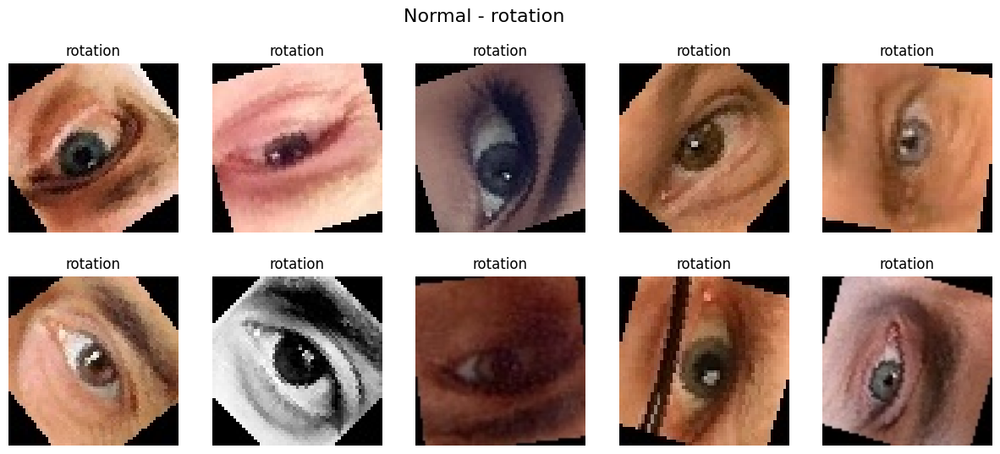

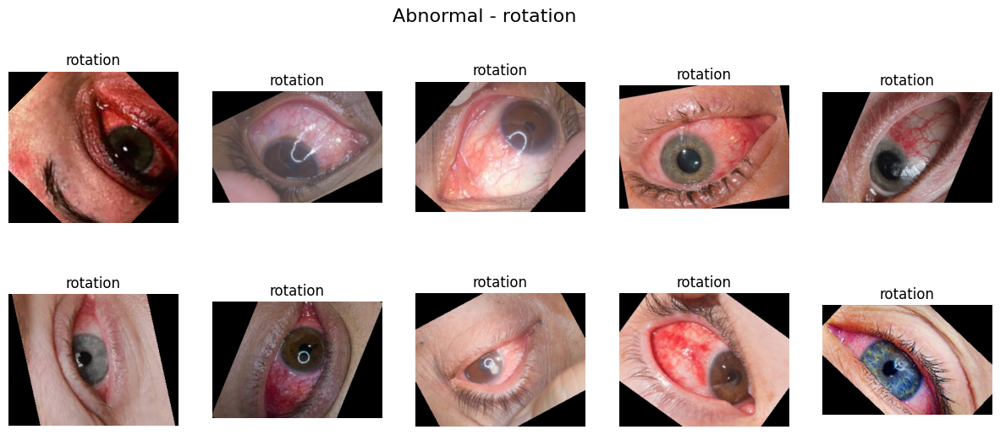

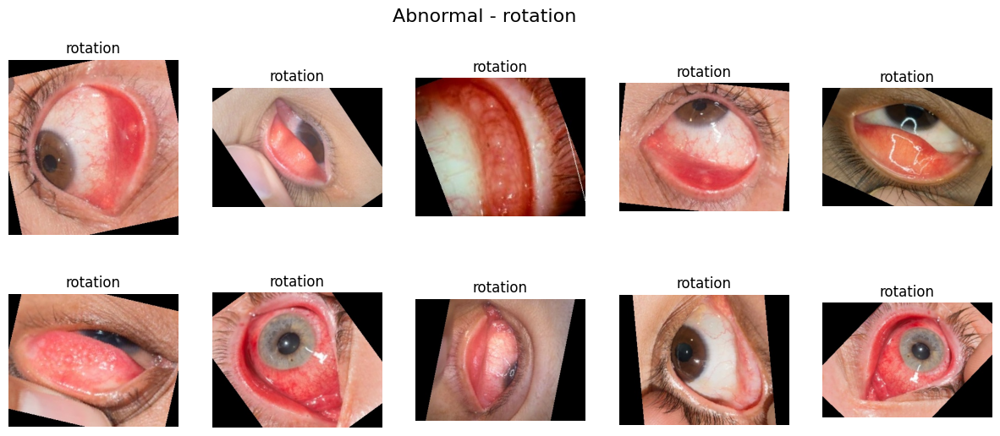

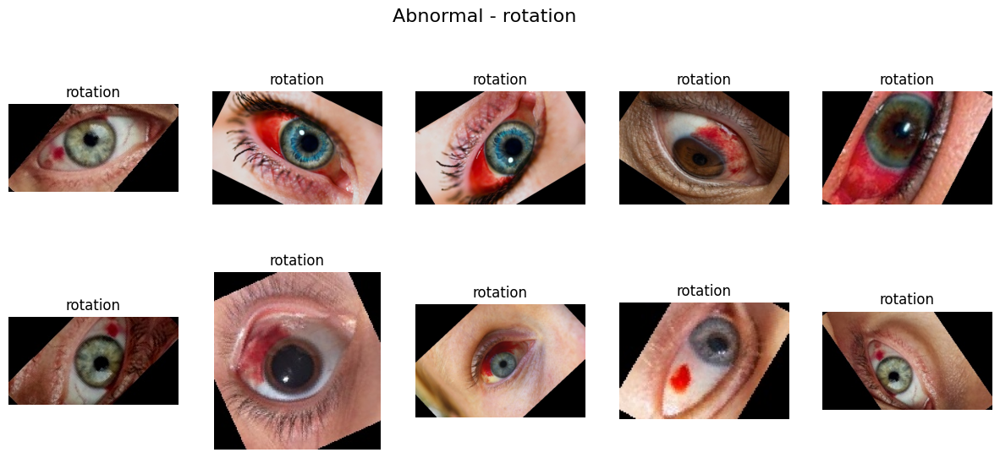

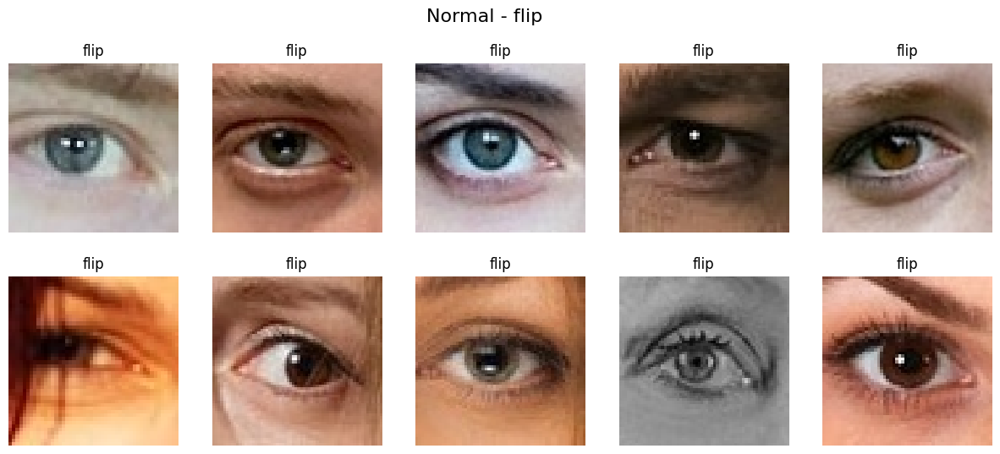

...

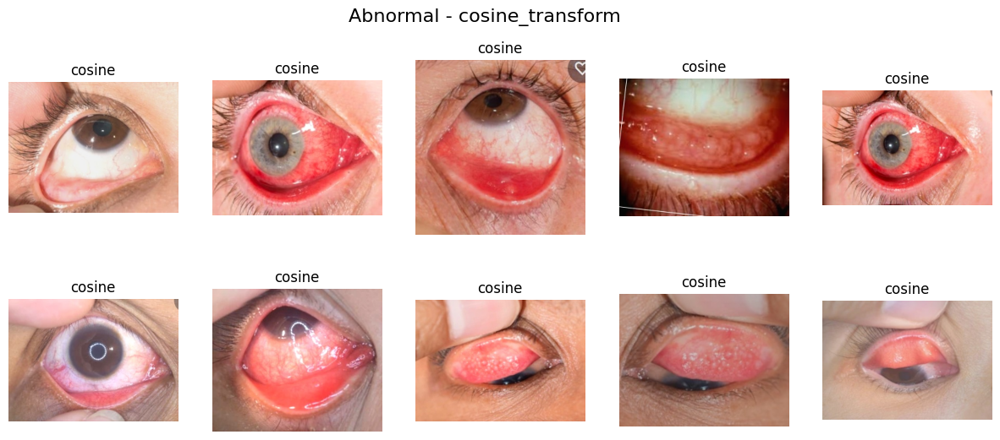

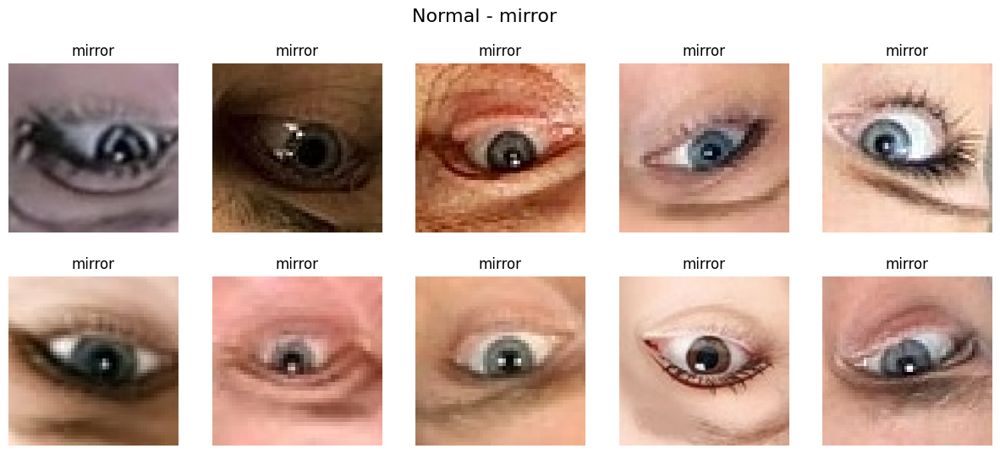

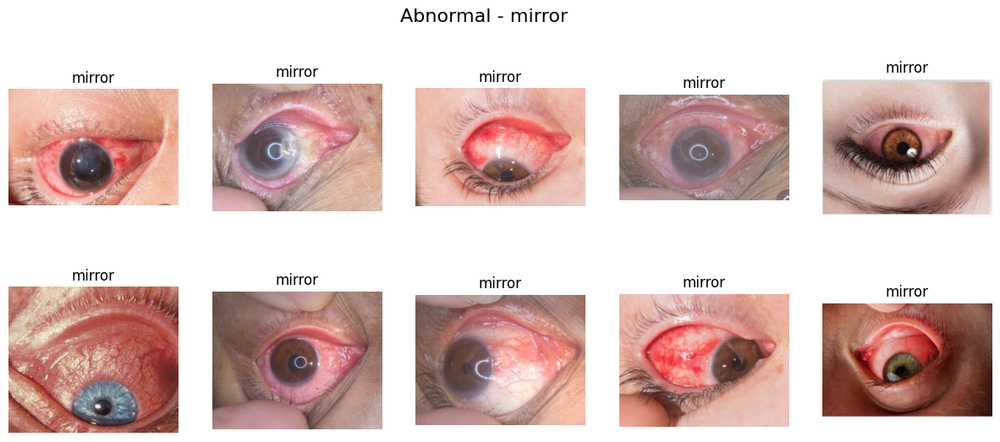

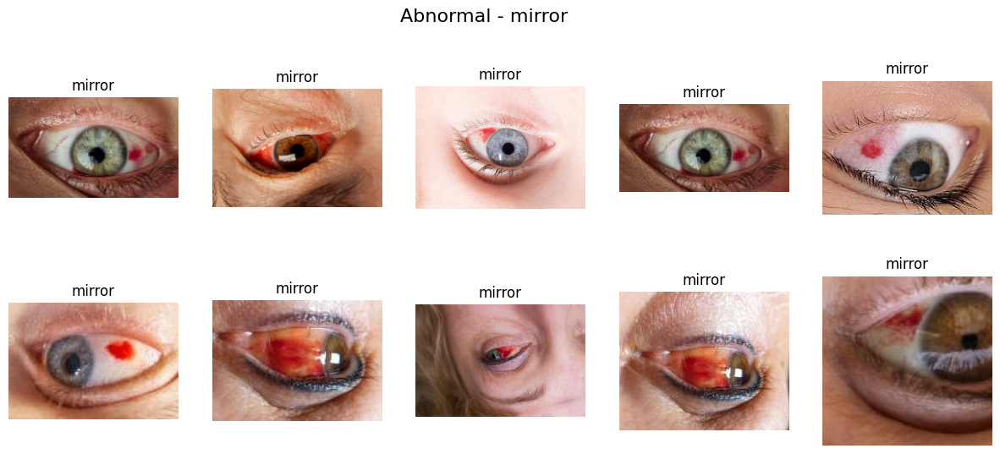

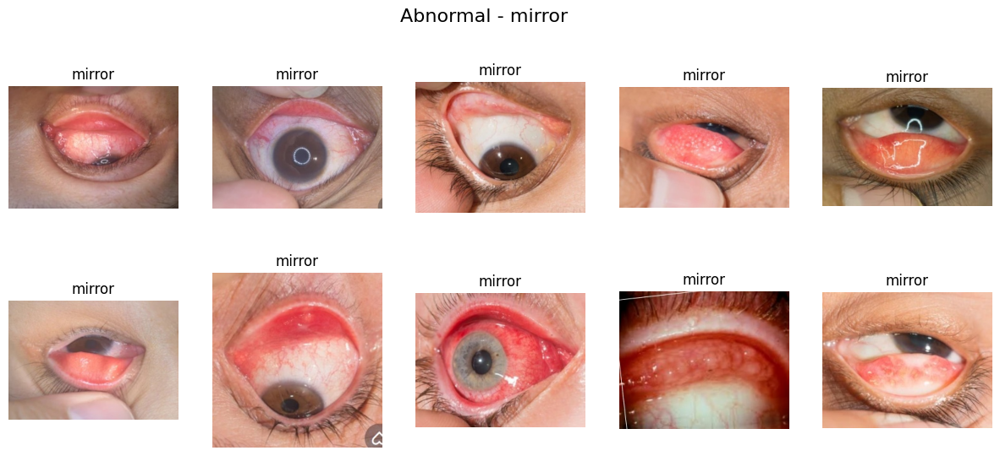

In [19]:
def display_images(category, subcat=None, aug_type="rotation", num_samples=10):
    """Displays images of a specific augmentation type."""
    
    cat_folder = category.lower()
    subcat_folder = subcat.lower().replace(" ", "_") if subcat else None

    folder = os.path.join(AUGMENTED_DATASET_PATH, f"Augmented_{cat_folder}")
    if subcat_folder:
        folder = os.path.join(folder, f"Augmented_{subcat_folder}")

    if not os.path.exists(folder):
        print(f"⚠️ Warning: Folder not found → {folder}")
        return

    image_files = [img for img in os.listdir(folder) if img.startswith(aug_type)]
    if len(image_files) == 0:
        print(f"⚠️ Warning: No images found for {aug_type} in → {folder}")
        return

    sample_images = np.random.choice(image_files, min(num_samples, len(image_files)), replace=False)

    fig, axes = plt.subplots(2, 5, figsize=(15, 6))
    fig.suptitle(f"{category} - {aug_type}", fontsize=16)

    for i, img_name in enumerate(sample_images):
        img_path = os.path.join(folder, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        row, col = divmod(i, 5)
        axes[row, col].imshow(img)
        axes[row, col].set_title(img_name.split('_')[0])
        axes[row, col].axis("off")

    plt.show()

# ✅ Display Rotation Images
display_images("Normal", aug_type="rotation")
for subcat in SUBCATEGORIES:
    display_images("Abnormal", subcat=subcat, aug_type="rotation")

display_images("Normal", aug_type="flip")
display_images("Abnormal", "Bulbar conjunctival redness", aug_type="flip")
display_images("Abnormal", "Sub conjunctival hemorhage", aug_type="flip")
display_images("Abnormal", "palpebral conjunctiva redness", aug_type="flip")

#Gaussian Noise

display_images("Normal", aug_type="gaussian_noise")
display_images("Abnormal", "Bulbar conjunctival redness", aug_type="gaussian_noise")
display_images("Abnormal", "Sub conjunctival hemorhage", aug_type="gaussian_noise")
display_images("Abnormal", "palpebral conjunctiva redness", aug_type="gaussian_noise")
#Cosine Transformation

display_images("Normal", aug_type="cosine_transform")
display_images("Abnormal", "Bulbar conjunctival redness", aug_type="cosine_transform")
display_images("Abnormal", "Sub conjunctival hemorhage", aug_type="cosine_transform")
display_images("Abnormal", "palpebral conjunctiva redness", aug_type="cosine_transform")
# Mirror Image

display_images("Normal", aug_type="mirror")
display_images("Abnormal", "Bulbar conjunctival redness", aug_type="mirror")
display_images("Abnormal", "Sub conjunctival hemorhage", aug_type="mirror")
display_images("Abnormal", "palpebral conjunctiva redness", aug_type="mirror")


## 5-Oversample & Undersample

In [20]:
import os
import cv2
import numpy as np

# Define paths
augmented_dataset_path = "/kaggle/working/augmented_redness"
balanced_dataset_path = "/kaggle/working/balanced_redness"

# Create a balanced dataset folder
os.makedirs(balanced_dataset_path, exist_ok=True)

# Define categories and their corresponding subcategories
categories = {
    "Augmented_normal": [],
    "Augmented_abnormal": [
        "Augmented_bulbar_conjunctival_redness",
        "Augmented_palpebral_conjunctiva_redness",
        "Augmented_sub_conjunctival_hemorhage"
    ]
}

# Count the number of images in each class
class_counts = {}
for category in categories:
    class_path = os.path.join(augmented_dataset_path, category)
    images = []
    
    if category == "Augmented_normal":
        images = os.listdir(class_path)  # Normal images are directly in this folder
    else:
        # For abnormal categories, navigate through the subcategories
        for subcat in categories[category]:
            subcat_path = os.path.join(class_path, subcat)
            if os.path.exists(subcat_path):
                images += os.listdir(subcat_path)

    class_counts[category] = len(images)

# Determine the minimum class count
min_count = min(class_counts.values())

# Balance the dataset
for category in categories:
    images = []
    
    if category == "Augmented_normal":
        images = os.listdir(os.path.join(augmented_dataset_path, category))
    else:
        for subcat in categories[category]:
            subcat_path = os.path.join(augmented_dataset_path, category, subcat)
            if os.path.exists(subcat_path):
                images += os.listdir(subcat_path)

    if len(images) > min_count:
        # Undersampling the normal class
        selected_images = np.random.choice(images, min_count, replace=False)
    else:
        # Oversampling the abnormal classes
        selected_images = images + np.random.choice(images, min_count - len(images), replace=True).tolist()

    # Save the balanced images to the new folder
    balanced_class_path = os.path.join(balanced_dataset_path, category)
    os.makedirs(balanced_class_path, exist_ok=True)

    for img_name in selected_images:
        if category == "Augmented_normal":
            src_path = os.path.join(augmented_dataset_path, category, img_name)
        else:
            # For abnormal categories, we need to find which subcategory the image belongs to
            for subcat in categories[category]:
                subcat_path = os.path.join(augmented_dataset_path, category, subcat)
                if img_name in os.listdir(subcat_path):
                    src_path = os.path.join(subcat_path, img_name)
                    break

        img = cv2.imread(src_path)

        # Check if the image was loaded successfully
        if img is None:
            print(f"⚠️ Warning: Could not load image → {src_path}")
            continue
        
        dst_path = os.path.join(balanced_class_path, img_name)
        cv2.imwrite(dst_path, img)

print("✅ Balanced dataset created!")


✅ Balanced dataset created!


## 6-Count of Balanced dataset and Analysis

In [21]:
import os
import pandas as pd
from collections import Counter

# Define paths
original_dataset_path = "/kaggle/input/redness1"
augmented_dataset_path = "/kaggle/working/augmented_redness"
balanced_dataset_path = "/kaggle/working/balanced_redness"

def count_images(directory):
    """Count the number of images in each category/subcategory of a directory"""
    counts = {}
    
    if not os.path.exists(directory):
        print(f"⚠️ Directory not found: {directory}")
        return counts
    
    # List all items in the directory
    for item in os.listdir(directory):
        item_path = os.path.join(directory, item)
        
        # If the item is a directory, count images inside it
        if os.path.isdir(item_path):
            # For categories like Normal, Abnormal
            category_counts = {}
            
            # Check if there are subdirectories (like for Abnormal)
            subdirs = os.listdir(item_path)
            has_subdirs = any(os.path.isdir(os.path.join(item_path, subdir)) for subdir in subdirs)
            
            if has_subdirs:
                # Process subdirectories (like different types of abnormal)
                for subdir in subdirs:
                    subdir_path = os.path.join(item_path, subdir)
                    if os.path.isdir(subdir_path):
                        subdir_images = [f for f in os.listdir(subdir_path) 
                                        if os.path.isfile(os.path.join(subdir_path, f))]
                        category_counts[subdir] = len(subdir_images)
            else:
                # No subdirectories, count images directly
                category_images = [f for f in os.listdir(item_path) 
                                  if os.path.isfile(os.path.join(item_path, f))]
                category_counts["_direct_"] = len(category_images)
            
            counts[item] = category_counts
            
    return counts

# Count images in each dataset
original_counts = count_images(original_dataset_path)
augmented_counts = count_images(augmented_dataset_path)
balanced_counts = count_images(balanced_dataset_path)

# Display the results in a readable format
print("📊 IMAGE COUNT ANALYSIS 📊")
print("=" * 50)

print("\n🔍 ORIGINAL DATASET")
print("-" * 50)
for category, subcats in original_counts.items():
    total = sum(subcats.values())
    print(f"📁 {category}: {total} images")
    for subcat, count in subcats.items():
        if subcat == "_direct_":
            continue
        print(f"  └─ {subcat}: {count} images")

print("\n🔍 AUGMENTED DATASET")
print("-" * 50)
for category, subcats in augmented_counts.items():
    total = sum(subcats.values())
    print(f"📁 {category}: {total} images")
    for subcat, count in subcats.items():
        if subcat == "_direct_":
            continue
        print(f"  └─ {subcat}: {count} images")

print("\n🔍 BALANCED DATASET")
print("-" * 50)
for category, subcats in balanced_counts.items():
    total = sum(subcats.values())
    print(f"📁 {category}: {total} images")
    for subcat, count in subcats.items():
        if subcat == "_direct_":
            continue
        print(f"  └─ {subcat}: {count} images")

# Calculate augmentation factors
print("\n📈 AUGMENTATION ANALYSIS")
print("-" * 50)

# For normal class
original_normal_count = sum(original_counts.get("Normal", {}).values())
augmented_normal_count = sum(augmented_counts.get("Augmented_normal", {}).values())
balanced_normal_count = sum(balanced_counts.get("Augmented_normal", {}).values())

# For abnormal classes
original_abnormal_count = sum(original_counts.get("Abnormal", {}).values())
augmented_abnormal_count = sum(augmented_counts.get("Augmented_abnormal", {}).values())
balanced_abnormal_count = sum(balanced_counts.get("Augmented_abnormal", {}).values())

print(f"Normal Images:")
print(f"  - Original: {original_normal_count}")
print(f"  - Augmented: {augmented_normal_count}")
print(f"  - Augmentation Factor: {augmented_normal_count/original_normal_count:.2f}x")
print(f"  - Balanced: {balanced_normal_count}")
print(f"  - Final Ratio (Balanced/Original): {balanced_normal_count/original_normal_count:.2f}x")

print(f"\nAbnormal Images:")
print(f"  - Original: {original_abnormal_count}")
print(f"  - Augmented: {augmented_abnormal_count}")
print(f"  - Augmentation Factor: {augmented_abnormal_count/original_abnormal_count:.2f}x")
print(f"  - Balanced: {balanced_abnormal_count}")
print(f"  - Final Ratio (Balanced/Original): {balanced_abnormal_count/original_abnormal_count:.2f}x")

print("\n✅ Analysis Complete!")


📊 IMAGE COUNT ANALYSIS 📊

🔍 ORIGINAL DATASET
--------------------------------------------------
📁 Normal: 649 images
📁 Abnormal: 231 images
  └─ Bulbar conjunctival redness: 143 images
  └─ palpebral conjunctiva redness: 14 images
  └─ Sub conjunctival hemorhage: 74 images

🔍 AUGMENTED DATASET
--------------------------------------------------
📁 Augmented_normal: 3245 images
📁 Augmented_abnormal: 1155 images
  └─ Augmented_bulbar_conjunctival_redness: 715 images
  └─ Augmented_palpebral_conjunctiva_redness: 70 images
  └─ Augmented_sub_conjunctival_hemorhage: 370 images

🔍 BALANCED DATASET
--------------------------------------------------
📁 Augmented_normal: 1155 images
📁 Augmented_abnormal: 1135 images

📈 AUGMENTATION ANALYSIS
--------------------------------------------------
Normal Images:
  - Original: 649
  - Augmented: 3245
  - Augmentation Factor: 5.00x
  - Balanced: 1155
  - Final Ratio (Balanced/Original): 1.78x

Abnormal Images:
  - Original: 231
  - Augmented: 1155
  - Augm

In [11]:
pip install efficientnet-pytorch


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 29.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 87.9 MB/s eta 0:00:00:00:0100:01
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16426 sha256=1880820732a93b0b5d8e85ed6043c98899f563d3d645abfcf4fa4fc9bc440e7e
  Stored in directory: /root/.cache/pip/wheels/8b/6f/9b/231a832f811ab6ebb1b32455b177ffc6b8b1cd8de19de70c09
Successfully built efficientnet-py

In [9]:
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms
from efficientnet_pytorch import EfficientNet
import cv2
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from sklearn.model_selection import train_test_split
from tqdm import tqdm


ModuleNotFoundError: No module named 'efficientnet_pytorch'

In [23]:
class EyeRednessDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform
        
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        try:
            image = cv2.imread(img_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            
            if image is None:
                print(f"Warning: Could not load image {img_path}")
                # Return a black image as a fallback
                image = np.zeros((224, 224, 3), dtype=np.uint8)
                
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
            image = np.zeros((224, 224, 3), dtype=np.uint8)
            
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
            
        return image, label


In [24]:
def restructure_balanced_dataset(augmented_path, balanced_path):
    """
    Restructure the balanced dataset to maintain subcategories for abnormal images.
    
    Args:
        augmented_path: Path to the augmented dataset
        balanced_path: Path to the balanced dataset (will be recreated)
    """
    import shutil
    import os
    
    # Create the balanced dataset directory if it doesn't exist
    if os.path.exists(balanced_path):
        shutil.rmtree(balanced_path)  # Remove existing directory
    os.makedirs(balanced_path, exist_ok=True)
    
    # Create normal directory in balanced dataset
    balanced_normal_path = os.path.join(balanced_path, "Normal")
    os.makedirs(balanced_normal_path, exist_ok=True)
    
    # Create abnormal subcategory directories in balanced dataset
    abnormal_subcategories = [
        "Bulbar_conjunctival_redness",
        "Palpebral_conjunctiva_redness",
        "Sub_conjunctival_hemorhage"
    ]
    
    for subcat in abnormal_subcategories:
        os.makedirs(os.path.join(balanced_path, subcat), exist_ok=True)
    
    # Get count of original balanced images in each category
    normal_count = len(os.listdir(os.path.join(balanced_path, "Augmented_normal"))) if \
                   os.path.exists(os.path.join(balanced_path, "Augmented_normal")) else 0
                   
    # Get all images from the augmented dataset
    augmented_normal_path = os.path.join(augmented_path, "Augmented_normal")
    augmented_abnormal_path = os.path.join(augmented_path, "Augmented_abnormal")
    
    # For normal images, copy the same number as in the balanced dataset
    if os.path.exists(augmented_normal_path):
        normal_images = os.listdir(augmented_normal_path)
        target_count = min(len(normal_images), 1155)  # Use the count from your analysis
        
        print(f"Copying {target_count} normal images...")
        for i, img_name in enumerate(normal_images[:target_count]):
            src = os.path.join(augmented_normal_path, img_name)
            dst = os.path.join(balanced_normal_path, img_name)
            shutil.copy2(src, dst)
    
    # For abnormal images, distribute them into respective subcategories
    if os.path.exists(augmented_abnormal_path):
        # Define prefix mapping to identify subcategories
        subcategory_prefixes = {
            "Augmented_bulbar_conjunctival_redness": "Bulbar_conjunctival_redness",
            "Augmented_palpebral_conjunctiva_redness": "Palpebral_conjunctiva_redness", 
            "Augmented_sub_conjunctival_hemorhage": "Sub_conjunctival_hemorhage"
        }
        
        # Iterate through each subcategory directory in augmented dataset
        for prefix, target_dir in subcategory_prefixes.items():
            subcat_path = os.path.join(augmented_abnormal_path, prefix)
            
            if os.path.exists(subcat_path):
                subcat_images = os.listdir(subcat_path)
                
                print(f"Copying {len(subcat_images)} images from {prefix}...")
                for img_name in subcat_images:
                    src = os.path.join(subcat_path, img_name)
                    dst = os.path.join(balanced_path, target_dir, img_name)
                    shutil.copy2(src, dst)
            else:
                # If directory doesn't exist, look for images with prefix in name
                abnormal_images = os.listdir(augmented_abnormal_path)
                matching_images = [img for img in abnormal_images if prefix in img]
                
                print(f"Found {len(matching_images)} images matching prefix {prefix}")
                for img_name in matching_images:
                    src = os.path.join(augmented_abnormal_path, img_name)
                    dst = os.path.join(balanced_path, target_dir, img_name)
                    shutil.copy2(src, dst)
    
    # Check the results
    print("\nRestructured dataset statistics:")
    for dir_name in ["Normal"] + abnormal_subcategories:
        dir_path = os.path.join(balanced_path, dir_name)
        if os.path.exists(dir_path):
            count = len(os.listdir(dir_path))
            print(f"  - {dir_name}: {count} images")
    
    return balanced_path


In [14]:
def prepare_data(dataset_path, img_size=300, batch_size=16):
    """
    Prepare data loaders for the restructured dataset.
    
    Args:
        dataset_path: Path to the restructured balanced dataset
        img_size: Size to resize images to
        batch_size: Batch size for training
    """
    # Define transformations for training and validation
    train_transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((img_size, img_size)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(15),
        transforms.ColorJitter(brightness=0.1, contrast=0.1),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    test_transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    # Load image paths and labels
    image_paths = []
    labels = []
    
    # Class definitions with direct mapping
    class_mapping = {
        'Normal': 0,
        'Bulbar_conjunctival_redness': 1,
        'Palpebral_conjunctiva_redness': 2,
        'Sub_conjunctival_hemorhage': 3
    }
    
    # Corresponding class names for reporting
    class_names = [
        'Normal',
        'Bulbar Conjunctival Redness',
        'Palpebral Conjunctiva Redness',
        'Sub Conjunctival Hemorrhage'
    ]
    
    # Explore all directories in the dataset path
    print(f"Loading data from: {dataset_path}")
    for class_dir in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_dir)
        
        if not os.path.isdir(class_path):
            continue
            
        if class_dir in class_mapping:
            class_label = class_mapping[class_dir]
            print(f"Processing class: {class_dir} (label: {class_label})")
            
            for img_name in os.listdir(class_path):
                img_path = os.path.join(class_path, img_name)
                if os.path.isfile(img_path):
                    image_paths.append(img_path)
                    labels.append(class_label)
        else:
            print(f"Warning: Unknown class directory: {class_dir}")
    
    # Verify we have images and labels
    if len(image_paths) == 0:
        raise ValueError("No images found in the dataset directory!")
    
    # Check class distribution
    labels_array = np.array(labels)
    print(f"Class distribution: {np.bincount(labels_array)}")
    
    # Split the dataset into training and validation sets
    X_train, X_test, y_train, y_test = train_test_split(
        image_paths, labels, test_size=0.2, random_state=42, stratify=labels
    )
    
    # Create dataset objects
    train_dataset = EyeRednessDataset(X_train, y_train, transform=train_transform)
    test_dataset = EyeRednessDataset(X_test, y_test, transform=test_transform)
    
    # Create data loaders
    train_loader = DataLoader(
        train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True
    )
    test_loader = DataLoader(
        test_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True
    )
    
    return train_loader, test_loader, class_names


In [15]:
def create_efficientnet_model(num_classes):
    # Load pre-trained EfficientNet-B3 model
    model = EfficientNet.from_pretrained('efficientnet-b3')
    
    # Modify the last fully connected layer for our classification task
    in_features = model._fc.in_features
    model._fc = nn.Linear(in_features, num_classes)
    
    return model


In [16]:
def train_model(model, train_loader, criterion, optimizer, device, num_epochs=15, scheduler=None):
    model.to(device)
    
    # For tracking training progress
    history = {
        'train_loss': [],
        'train_acc': []
    }
    
    best_acc = 0.0
    
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        running_corrects = 0
        total_samples = 0
        
        # Progress bar for the training batches
        train_pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}')
        
        for inputs, labels in train_pbar:
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            # Zero the parameter gradients
            optimizer.zero_grad()
            
            # Forward pass
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)
            
            # Backward pass + optimize
            loss.backward()
            optimizer.step()
            
            # Statistics
            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)
            total_samples += inputs.size(0)
            
            # Update progress bar
            train_pbar.set_postfix({
                'loss': loss.item(),
                'acc': (torch.sum(preds == labels.data) / inputs.size(0)).item()
            })
        
        epoch_loss = running_loss / total_samples
        epoch_acc = running_corrects.double() / total_samples
        
        # Update scheduler with the appropriate metric
        if scheduler and isinstance(scheduler, optim.lr_scheduler.ReduceLROnPlateau):
            scheduler.step(epoch_acc)  # Pass the accuracy as the metric
        elif scheduler:
            scheduler.step()
            
        # Update history
        history['train_loss'].append(epoch_loss)
        history['train_acc'].append(epoch_acc.item())
        
        print(f'Epoch {epoch+1}/{num_epochs} - Loss: {epoch_loss:.4f}, Acc: {epoch_acc:.4f}')
        
        # Save the best model
        if epoch_acc > best_acc:
            best_acc = epoch_acc
            torch.save(model.state_dict(), '/kaggle/working/efficientnet_b3_best_model.pth')
            print(f'Best model saved with accuracy: {best_acc:.4f}')
    
    return model, history


In [17]:
def evaluate_model(model, test_loader, criterion, device, class_names):
    model.eval()
    running_loss = 0.0
    running_corrects = 0
    total_samples = 0
    
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for inputs, labels in tqdm(test_loader, desc='Evaluating'):
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)
            
            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)
            total_samples += inputs.size(0)
            
            # Store predictions and labels for confusion matrix
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    test_loss = running_loss / total_samples
    test_acc = running_corrects.double() / total_samples
    
    print(f'Test Loss: {test_loss:.4f}, Test Acc: {test_acc:.4f}')
    
    # Calculate and print classification report
    report = classification_report(all_labels, all_preds, target_names=class_names)
    print("\nClassification Report:")
    print(report)
    
    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    cm = confusion_matrix(all_labels, all_preds)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Confusion Matrix')
    plt.tight_layout()
    plt.savefig('/kaggle/working/confusion_matrix.png')
    plt.show()
    
    return test_acc, all_preds, all_labels


In [ ]:
def main():
    # Set device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    
    # Set paths
    augmented_dataset_path = "/kaggle/working/augmented_redness"
    original_balanced_path = "/kaggle/working/balanced_redness"
    restructured_balanced_path = "/kaggle/working/restructured_balanced_redness"
    
    # Step 1: Restructure the balanced dataset
    print("Restructuring balanced dataset to preserve subcategories...")
    restructured_path = restructure_balanced_dataset(augmented_dataset_path, restructured_balanced_path)
    
    # Parameters for training
    num_classes = 4  # Normal + 3 types of abnormal
    num_epochs = 15
    batch_size = 16
    learning_rate = 0.001
    
    # Step 2: Prepare data with the restructured dataset
    print("\nPreparing datasets...")
    train_loader, test_loader, class_names = prepare_data(
        restructured_path, img_size=300, batch_size=batch_size
    )
    
    # Step 3: Create model
    print("Creating EfficientNet-B3 model...")
    model = create_efficientnet_model(num_classes)
    
    # Define loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    # Learning rate scheduler
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='max', factor=0.1, patience=3, verbose=True
    )
    
    # Step 4: Train the model
    print("Starting training...")
    model, history = train_model(
        model, train_loader, criterion, optimizer, device, num_epochs, scheduler
    )
    
    # Load the best model for evaluation
    model.load_state_dict(torch.load('/kaggle/working/efficientnet_b3_best_model.pth'))
    
    # Step 5: Evaluate the model
    print("Evaluating model...")
    test_acc, all_preds, all_labels = evaluate_model(
        model, test_loader, criterion, device, class_names
    )
    
    # Plot training history
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(history['train_loss'])
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    
    plt.subplot(1, 2, 2)
    plt.plot(history['train_acc'])
    plt.title('Training Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    
    plt.tight_layout()
    plt.savefig('/kaggle/working/training_history.png')
    plt.show()
    
    # Visualize some predictions
    visualize_predictions(model, test_loader, class_names, device)
    
    # Save the final model
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'class_names': class_names
    }, '/kaggle/working/efficientnet_b3_final_model.pth')
    
    print("Training and evaluation completed!")
    print(f"Final test accuracy: {test_acc:.4f}")
    print(f"Model saved to /kaggle/working/efficientnet_b3_final_model.pth")



# Training Using Random Forest

In [3]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from tqdm import tqdm
import joblib


In [4]:
def extract_features(image_path, target_size=(128, 128)):
    """
    Extract features from an image for Random Forest classification.
    
    Args:
        image_path: Path to the image file
        target_size: Size to resize image to before feature extraction
        
    Returns:
        features: Extracted features as a flat array
    """
    try:
        # Read and resize image
        img = cv2.imread(image_path)
        if img is None:
            print(f"Warning: Could not load image {image_path}")
            return None
            
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, target_size)
        
        # Extract features
        features = []
        
        # 1. Color histograms (RGB channels)
        for i in range(3):
            hist = cv2.calcHist([img], [i], None, [32], [0, 256])
            features.extend(hist.flatten())
            
        # 2. Texture features using Haralick texture
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
        # GLCM features (simplified)
        from skimage.feature import graycomatrix, graycoprops
        glcm = graycomatrix(gray, [1], [0], 256, symmetric=True, normed=True)
        
        # Extract GLCM properties
        contrast = graycoprops(glcm, 'contrast')[0, 0]
        dissimilarity = graycoprops(glcm, 'dissimilarity')[0, 0]
        homogeneity = graycoprops(glcm, 'homogeneity')[0, 0]
        energy = graycoprops(glcm, 'energy')[0, 0]
        correlation = graycoprops(glcm, 'correlation')[0, 0]
        
        features.extend([contrast, dissimilarity, homogeneity, energy, correlation])
        
        # 3. Edge features
        edges = cv2.Canny(gray, 100, 200)
        edge_count = np.count_nonzero(edges)
        features.append(edge_count / (target_size[0] * target_size[1]))  # Normalize
        
        # 4. Simple statistical features
        for i in range(3):
            channel = img[:,:,i]
            features.extend([
                np.mean(channel),
                np.std(channel),
                np.min(channel),
                np.max(channel)
            ])
        
        return np.array(features)
        
    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        return None


In [5]:
def prepare_data_for_random_forest(dataset_path, test_size=0.2):
    """
    Prepare data for Random Forest classifier.
    
    Args:
        dataset_path: Path to the restructured dataset
        test_size: Proportion of data to use for testing
        
    Returns:
        X_train, X_test, y_train, y_test, class_names
    """
    # Class definitions with direct mapping
    class_mapping = {
        'Normal': 0,
        'Bulbar_conjunctival_redness': 1,
        'Palpebral_conjunctiva_redness': 2,
        'Sub_conjunctival_hemorhage': 3
    }
    
    # Corresponding class names for reporting
    class_names = [
        'Normal',
        'Bulbar Conjunctival Redness',
        'Palpebral Conjunctiva Redness',
        'Sub Conjunctival Hemorrhage'
    ]
    
    # Load image paths and labels
    image_paths = []
    labels = []
    
    # Explore all directories in the dataset path
    print(f"Loading data from: {dataset_path}")
    for class_dir in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_dir)
        
        if not os.path.isdir(class_path):
            continue
            
        if class_dir in class_mapping:
            class_label = class_mapping[class_dir]
            print(f"Processing class: {class_dir} (label: {class_label})")
            
            for img_name in os.listdir(class_path):
                img_path = os.path.join(class_path, img_name)
                if os.path.isfile(img_path):
                    image_paths.append(img_path)
                    labels.append(class_label)
        else:
            print(f"Warning: Unknown class directory: {class_dir}")
    
    # Verify we have images and labels
    if len(image_paths) == 0:
        raise ValueError("No images found in the dataset directory!")
    
    # Check class distribution
    labels_array = np.array(labels)
    print(f"Class distribution: {np.bincount(labels_array)}")
    
    # Split the dataset into training and validation sets
    X_train_paths, X_test_paths, y_train, y_test = train_test_split(
        image_paths, labels, test_size=test_size, random_state=42, stratify=labels
    )
    
    # Extract features for all images
    print("Extracting features from training images...")
    X_train = []
    for img_path in tqdm(X_train_paths):
        features = extract_features(img_path)
        if features is not None:
            X_train.append(features)
    
    print("Extracting features from testing images...")
    X_test = []
    for img_path in tqdm(X_test_paths):
        features = extract_features(img_path)
        if features is not None:
            X_test.append(features)
    
    # Ensure all feature vectors have the same length
    min_length = min(len(features) for features in X_train + X_test)
    X_train = [features[:min_length] for features in X_train]
    X_test = [features[:min_length] for features in X_test]
    
    # Convert to numpy arrays
    X_train = np.array(X_train)
    X_test = np.array(X_test)
    y_train = np.array(y_train[:len(X_train)])  # Match lengths in case some images failed
    y_test = np.array(y_test[:len(X_test)])
    
    print(f"Final dataset shapes: X_train {X_train.shape}, X_test {X_test.shape}")
    
    return X_train, X_test, y_train, y_test, class_names


In [6]:
def train_random_forest(X_train, y_train, n_estimators=100, max_depth=None):
    """
    Train a Random Forest classifier.
    
    Args:
        X_train: Training features
        y_train: Training labels
        n_estimators: Number of trees in the forest
        max_depth: Maximum depth of the trees
        
    Returns:
        Trained model
    """
    print("Training Random Forest classifier...")
    model = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        random_state=42,
        n_jobs=-1,  # Use all available cores
        verbose=1
    )
    
    model.fit(X_train, y_train)
    return model

def evaluate_random_forest(model, X_test, y_test, class_names):
    """
    Evaluate the Random Forest classifier.
    
    Args:
        model: Trained Random Forest model
        X_test: Test features
        y_test: Test labels
        class_names: Names of the classes
        
    Returns:
        accuracy: Test accuracy
    """
    print("Evaluating Random Forest classifier...")
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    
    print(f"Test Accuracy: {accuracy:.4f}")
    
    # Calculate and print classification report
    report = classification_report(y_test, y_pred, target_names=class_names)
    print("\nClassification Report:")
    print(report)
    
    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Confusion Matrix')
    plt.tight_layout()
    plt.savefig('/kaggle/working/rf_confusion_matrix.png')
    plt.show()
    
    # Feature importance
    plt.figure(figsize=(12, 6))
    importances = model.feature_importances_
    indices = np.argsort(importances)[::-1]
    plt.bar(range(min(20, len(importances))), importances[indices[:20]])
    plt.title('Feature Importances')
    plt.xlabel('Feature Index')
    plt.savefig('/kaggle/working/rf_feature_importance.png')
    plt.show()
    
    return accuracy, y_pred


In [7]:
def tune_random_forest(X_train, y_train, cv=3):
    """
    Tune Random Forest hyperparameters using GridSearchCV.
    
    Args:
        X_train: Training features
        y_train: Training labels
        cv: Number of cross-validation folds
        
    Returns:
        Best model and parameters
    """
    print("Tuning Random Forest hyperparameters...")
    
    # Define the parameter grid
    param_grid = {
        'n_estimators': [50, 100, 200],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }
    
    # Create the grid search model
    grid_search = GridSearchCV(
        RandomForestClassifier(random_state=42),
        param_grid=param_grid,
        cv=cv,
        n_jobs=-1,
        verbose=2,
        scoring='accuracy'
    )
    
    # Fit the grid search
    grid_search.fit(X_train, y_train)
    
    print(f"Best parameters: {grid_search.best_params_}")
    print(f"Best cross-validation score: {grid_search.best_score_:.4f}")
    
    return grid_search.best_estimator_, grid_search.best_params_


In [8]:
def main():
    # Set paths
    augmented_dataset_path = "/kaggle/working/augmented_redness"
    restructured_balanced_path = "/kaggle/working/restructured_balanced_redness"
    
    # Step 1: Restructure the balanced dataset (same as before)
    print("Restructuring balanced dataset to preserve subcategories...")
    restructured_path = restructure_balanced_dataset(augmented_dataset_path, restructured_balanced_path)
    
    # Step 2: Prepare data for Random Forest
    print("\nPreparing datasets for Random Forest...")
    X_train, X_test, y_train, y_test, class_names = prepare_data_for_random_forest(
        restructured_path, test_size=0.2
    )
    
    # Step 3: Train the Random Forest model
    print("Training Random Forest model...")
    rf_model = train_random_forest(X_train, y_train, n_estimators=100)
    
    # Step 4: Evaluate the model
    print("Evaluating model...")
    accuracy, y_pred = evaluate_random_forest(rf_model, X_test, y_test, class_names)
    
    # Step 5: Save the model
    model_save_path = '/kaggle/working/random_forest_model.joblib'
    joblib.dump(rf_model, model_save_path)
    
    # Also save feature extractor parameters for inference
    feature_params = {
        'target_size': (128, 128)
    }
    joblib.dump(feature_params, '/kaggle/working/feature_params.joblib')
    
    print("Training and evaluation completed!")
    print(f"Final test accuracy: {accuracy:.4f}")
    print(f"Model saved to {model_save_path}")


Restructuring balanced dataset to preserve subcategories...
Copying 1155 normal images...
Copying 715 images from Augmented_bulbar_conjunctival_redness...
Copying 70 images from Augmented_palpebral_conjunctiva_redness...
Copying 370 images from Augmented_sub_conjunctival_hemorhage...

Restructured dataset statistics:
  - Normal: 1155 images
  - Bulbar_conjunctival_redness: 715 images
  - Palpebral_conjunctiva_redness: 70 images
  - Sub_conjunctival_hemorhage: 370 images

Preparing datasets for Random Forest...
Loading data from: /kaggle/working/restructured_balanced_redness
Processing class: Bulbar_conjunctival_redness (label: 1)
Processing class: Normal (label: 0)
Processing class: Palpebral_conjunctiva_redness (label: 2)
Processing class: Sub_conjunctival_hemorhage (label: 3)
Class distribution: [1155  715   70  370]
Extracting features from training images...


100%|██████████| 1848/1848 [00:10<00:00, 170.37it/s]


Extracting features from testing images...


100%|██████████| 462/462 [00:02<00:00, 175.84it/s]
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.


Final dataset shapes: X_train (1848, 114), X_test (462, 114)
Training Random Forest model...
Training Random Forest classifier...


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished


Evaluating model...
Evaluating Random Forest classifier...
Test Accuracy: 0.9481

Classification Report:
                               precision    recall  f1-score   support

                       Normal       0.97      1.00      0.99       231
  Bulbar Conjunctival Redness       0.92      0.92      0.92       143
Palpebral Conjunctiva Redness       1.00      0.64      0.78        14
  Sub Conjunctival Hemorrhage       0.91      0.91      0.91        74

                     accuracy                           0.95       462
                    macro avg       0.95      0.87      0.90       462
                 weighted avg       0.95      0.95      0.95       462



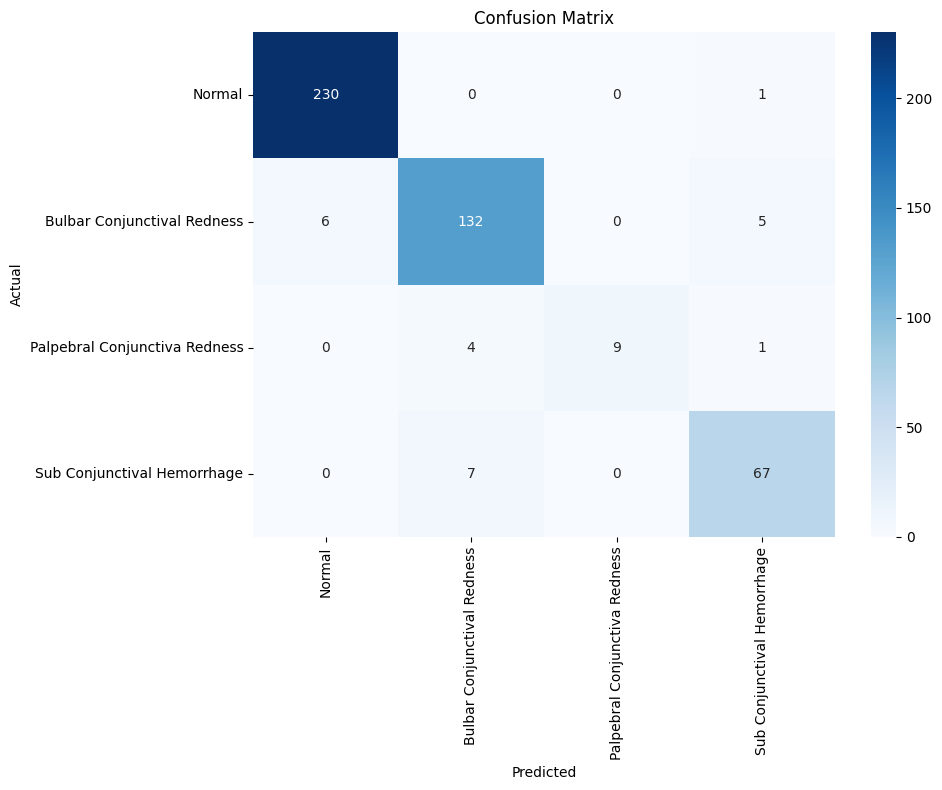

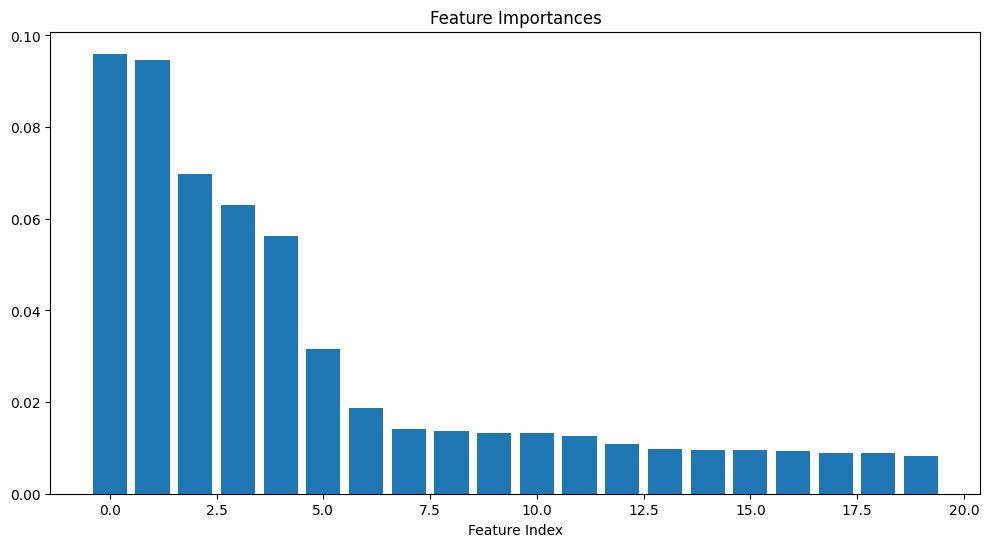

Training and evaluation completed!
Final test accuracy: 0.9481
Model saved to /kaggle/working/random_forest_model.joblib


In [25]:
if __name__ == "__main__":
    main()


# Training Using MobileNet V3

### 1. Import Required Libraries

In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms, models
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import shutil
import warnings
warnings.filterwarnings('ignore')

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


Using device: cuda


### 2. Dataset Class for Eye Redness Images


In [2]:
class EyeRednessDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform
        
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        try:
            # Load image
            image = cv2.imread(img_path)
            if image is None:
                print(f"Warning: Could not load image {img_path}")
                image = np.zeros((224, 224, 3), dtype=np.uint8)
            else:
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
            image = np.zeros((224, 224, 3), dtype=np.uint8)
            
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
            
        return image, label


### 3. Create MobileNetV3 Model

In [3]:
class MobileNetV3EyeClassifier(nn.Module):
    def __init__(self, num_classes=4, pretrained=True):
        super(MobileNetV3EyeClassifier, self).__init__()
        
        # Load pre-trained MobileNetV3-Large
        self.backbone = models.mobilenet_v3_large(pretrained=pretrained)
        
        # Get the number of features from the classifier
        num_features = self.backbone.classifier[0].in_features
        
        # Replace the classifier with our custom one
        self.backbone.classifier = nn.Sequential(
            nn.Linear(num_features, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.2),
            nn.Linear(256, num_classes)
        )
        
    def forward(self, x):
        return self.backbone(x)

def create_mobilenet_model(num_classes=4, pretrained=True):
    """Create and return MobileNetV3 model for eye redness classification"""
    model = MobileNetV3EyeClassifier(num_classes=num_classes, pretrained=pretrained)
    return model


### 4. Data Preparation and Preprocessing

In [4]:
def prepare_data_mobilenet(dataset_path, img_size=224, batch_size=32, test_size=0.2):
    """
    Prepare data loaders for MobileNet training.
    
    Args:
        dataset_path: Path to the restructured dataset
        img_size: Input image size for MobileNet
        batch_size: Batch size for training
        test_size: Proportion of data for testing
    """
    
    # Data transforms optimized for MobileNet and medical images
    train_transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((img_size, img_size)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(degrees=15),
        transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.05),
        transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet normalization
    ])
    
    val_transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    # Class mapping
    class_mapping = {
        'Normal': 0,
        'Bulbar_conjunctival_redness': 1,
        'Palpebral_conjunctiva_redness': 2,
        'Sub_conjunctival_hemorhage': 3
    }
    
    class_names = [
        'Normal',
        'Bulbar Conjunctival Redness',
        'Palpebral Conjunctiva Redness',
        'Sub Conjunctival Hemorrhage'
    ]
    
    # Load image paths and labels
    image_paths = []
    labels = []
    
    print(f"Loading data from: {dataset_path}")
    for class_dir in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_dir)
        
        if not os.path.isdir(class_path):
            continue
            
        if class_dir in class_mapping:
            class_label = class_mapping[class_dir]
            print(f"Processing class: {class_dir} (label: {class_label})")
            
            class_images = 0
            for img_name in os.listdir(class_path):
                img_path = os.path.join(class_path, img_name)
                if os.path.isfile(img_path) and any(img_name.lower().endswith(ext) for ext in ['.jpg', '.jpeg', '.png', '.bmp']):
                    image_paths.append(img_path)
                    labels.append(class_label)
                    class_images += 1
            
            print(f"  Found {class_images} images")
        else:
            print(f"Warning: Unknown class directory: {class_dir}")
    
    if len(image_paths) == 0:
        raise ValueError("No images found in the dataset directory!")
    
    # Check class distribution
    labels_array = np.array(labels)
    unique_labels, counts = np.unique(labels_array, return_counts=True)
    print(f"\nClass distribution:")
    for i, (label, count) in enumerate(zip(unique_labels, counts)):
        print(f"  Class {label} ({class_names[label]}): {count} images")
    
    # Split the dataset
    X_train, X_test, y_train, y_test = train_test_split(
        image_paths, labels, test_size=test_size, random_state=42, stratify=labels
    )
    
    print(f"\nDataset split:")
    print(f"  Training samples: {len(X_train)}")
    print(f"  Testing samples: {len(X_test)}")
    
    # Create datasets
    train_dataset = EyeRednessDataset(X_train, y_train, transform=train_transform)
    test_dataset = EyeRednessDataset(X_test, y_test, transform=val_transform)
    
    # Create data loaders
    train_loader = DataLoader(
        train_dataset, 
        batch_size=batch_size, 
        shuffle=True, 
        num_workers=4, 
        pin_memory=True if device.type == 'cuda' else False
    )
    
    test_loader = DataLoader(
        test_dataset, 
        batch_size=batch_size, 
        shuffle=False, 
        num_workers=4, 
        pin_memory=True if device.type == 'cuda' else False
    )
    
    return train_loader, test_loader, class_names, labels_array


### 5.Training Function with Advanced Features

In [5]:
def train_mobilenet(model, train_loader, test_loader, num_epochs=25, learning_rate=0.001):
    """
    Train MobileNet model with advanced training techniques.
    
    Args:
        model: MobileNet model to train
        train_loader: Training data loader
        test_loader: Testing data loader
        num_epochs: Number of training epochs
        learning_rate: Initial learning rate
    """
    
    model = model.to(device)
    
    # Loss function with class weights (if needed)
    criterion = nn.CrossEntropyLoss()
    
    # Optimizer with different learning rates for backbone and classifier
    backbone_params = []
    classifier_params = []
    
    for name, param in model.named_parameters():
        if 'classifier' in name:
            classifier_params.append(param)
        else:
            backbone_params.append(param)
    
    optimizer = optim.AdamW([
        {'params': backbone_params, 'lr': learning_rate * 0.1},  # Lower LR for pre-trained backbone
        {'params': classifier_params, 'lr': learning_rate}       # Higher LR for new classifier
    ], weight_decay=1e-4)
    
    # Learning rate scheduler
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='max', factor=0.5, patience=5, verbose=True, min_lr=1e-7
    )
    
    # Training history
    history = {
        'train_loss': [],
        'train_acc': [],
        'val_loss': [],
        'val_acc': []
    }
    
    best_acc = 0.0
    patience_counter = 0
    patience = 10
    
    print("Starting MobileNet training...")
    print("=" * 60)
    
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        running_loss = 0.0
        running_corrects = 0
        total_samples = 0
        
        train_pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs} [Train]')
        
        for inputs, labels in train_pbar:
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            # Zero gradients
            optimizer.zero_grad()
            
            # Forward pass
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)
            
            # Backward pass
            loss.backward()
            
            # Gradient clipping for stability
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            
            optimizer.step()
            
            # Statistics
            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)
            total_samples += inputs.size(0)
            
            # Update progress bar
            current_acc = (torch.sum(preds == labels.data).double() / inputs.size(0)).item()
            train_pbar.set_postfix({
                'Loss': f'{loss.item():.4f}',
                'Acc': f'{current_acc:.4f}'
            })
        
        # Calculate training metrics
        epoch_train_loss = running_loss / total_samples
        epoch_train_acc = running_corrects.double() / total_samples
        
        # Validation phase
        model.eval()
        val_loss = 0.0
        val_corrects = 0
        val_total = 0
        
        with torch.no_grad():
            val_pbar = tqdm(test_loader, desc=f'Epoch {epoch+1}/{num_epochs} [Val]')
            
            for inputs, labels in val_pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)
                
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)
                
                val_loss += loss.item() * inputs.size(0)
                val_corrects += torch.sum(preds == labels.data)
                val_total += inputs.size(0)
                
                current_val_acc = (torch.sum(preds == labels.data).double() / inputs.size(0)).item()
                val_pbar.set_postfix({
                    'Val Loss': f'{loss.item():.4f}',
                    'Val Acc': f'{current_val_acc:.4f}'
                })
        
        # Calculate validation metrics
        epoch_val_loss = val_loss / val_total
        epoch_val_acc = val_corrects.double() / val_total
        
        # Update history
        history['train_loss'].append(epoch_train_loss)
        history['train_acc'].append(epoch_train_acc.item())
        history['val_loss'].append(epoch_val_loss)
        history['val_acc'].append(epoch_val_acc.item())
        
        # Print epoch results
        print(f'\nEpoch {epoch+1}/{num_epochs}:')
        print(f'  Train Loss: {epoch_train_loss:.4f}, Train Acc: {epoch_train_acc:.4f}')
        print(f'  Val Loss: {epoch_val_loss:.4f}, Val Acc: {epoch_val_acc:.4f}')
        
        # Learning rate scheduling
        scheduler.step(epoch_val_acc)
        
        # Save best model
        if epoch_val_acc > best_acc:
            best_acc = epoch_val_acc
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'best_acc': best_acc,
                'history': history
            }, '/kaggle/working/mobilenet_best_model.pth')
            print(f'  ✅ New best model saved! Accuracy: {best_acc:.4f}')
            patience_counter = 0
        else:
            patience_counter += 1
        
        # Early stopping
        if patience_counter >= patience:
            print(f'\nEarly stopping triggered after {patience} epochs without improvement.')
            break
        
        print("-" * 60)
    
    print(f'\nTraining completed! Best validation accuracy: {best_acc:.4f}')
    return model, history


### 6.Evaluation Function

In [6]:
def evaluate_mobilenet(model, test_loader, class_names):
    """
    Comprehensive evaluation of the MobileNet model.
    
    Args:
        model: Trained MobileNet model
        test_loader: Test data loader
        class_names: List of class names
    """
    
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = []
    
    print("Evaluating MobileNet model...")
    
    with torch.no_grad():
        for inputs, labels in tqdm(test_loader, desc='Evaluating'):
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            outputs = model(inputs)
            probs = torch.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)
            
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    
    # Calculate accuracy
    accuracy = accuracy_score(all_labels, all_preds)
    print(f'\nTest Accuracy: {accuracy:.4f} ({accuracy*100:.2f}%)')
    
    # Classification report
    report = classification_report(all_labels, all_preds, target_names=class_names, digits=4)
    print("\n" + "="*50)
    print("CLASSIFICATION REPORT")
    print("="*50)
    print(report)
    
    # Confusion Matrix
    plt.figure(figsize=(12, 10))
    cm = confusion_matrix(all_labels, all_preds)
    
    # Plot confusion matrix
    plt.subplot(2, 2, 1)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=class_names, yticklabels=class_names)
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    # Normalized confusion matrix
    plt.subplot(2, 2, 2)
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    sns.heatmap(cm_normalized, annot=True, fmt='.3f', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title('Normalized Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    # Per-class accuracy
    plt.subplot(2, 2, 3)
    class_accuracies = cm.diagonal() / cm.sum(axis=1)
    plt.bar(range(len(class_names)), class_accuracies)
    plt.title('Per-Class Accuracy')
    plt.xlabel('Class')
    plt.ylabel('Accuracy')
    plt.xticks(range(len(class_names)), [name.split()[0] for name in class_names], rotation=45)
    
    # Class distribution
    plt.subplot(2, 2, 4)
    unique_labels, counts = np.unique(all_labels, return_counts=True)
    plt.bar(range(len(unique_labels)), counts)
    plt.title('Test Set Class Distribution')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(range(len(class_names)), [name.split()[0] for name in class_names], rotation=45)
    
    plt.tight_layout()
    plt.savefig('/kaggle/working/mobilenet_evaluation_results.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    return accuracy, all_preds, all_labels, all_probs


### 7. Visualization

In [7]:
def plot_training_history(history):
    """Plot training history"""
    plt.figure(figsize=(15, 5))
    
    # Loss plot
    plt.subplot(1, 3, 1)
    plt.plot(history['train_loss'], label='Training Loss')
    plt.plot(history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    
    # Accuracy plot
    plt.subplot(1, 3, 2)
    plt.plot(history['train_acc'], label='Training Accuracy')
    plt.plot(history['val_acc'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)
    
    # Learning curve
    plt.subplot(1, 3, 3)
    plt.plot(np.array(history['train_acc']) - np.array(history['val_acc']), 
             label='Overfitting Gap', color='red')
    plt.title('Overfitting Analysis')
    plt.xlabel('Epoch')
    plt.ylabel('Train Acc - Val Acc')
    plt.legend()
    plt.grid(True)
    plt.axhline(y=0, color='black', linestyle='--', alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('/kaggle/working/mobilenet_training_history.png', dpi=300, bbox_inches='tight')
    plt.show()

def visualize_predictions(model, test_loader, class_names, num_samples=16):
    """Visualize model predictions on test samples"""
    model.eval()
    
    # Get a batch of test data
    data_iter = iter(test_loader)
    images, labels = next(data_iter)
    
    # Move to device and get predictions
    images = images.to(device)
    with torch.no_grad():
        outputs = model(images)
        probs = torch.softmax(outputs, dim=1)
        _, preds = torch.max(outputs, 1)
    
    # Move back to CPU for visualization
    images = images.cpu()
    preds = preds.cpu()
    probs = probs.cpu()
    
    # Denormalize images for display
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    
    fig, axes = plt.subplots(4, 4, figsize=(16, 16))
    axes = axes.ravel()
    
    for i in range(min(num_samples, len(images))):
        # Denormalize image
        img = images[i] * std[:, None, None] + mean[:, None, None]
        img = torch.clamp(img, 0, 1)
        img = img.permute(1, 2, 0)
        
        # Plot image
        axes[i].imshow(img)
        
        # Get prediction info
        true_label = class_names[labels[i]]
        pred_label = class_names[preds[i]]
        confidence = probs[i][preds[i]] * 100
        
        # Set title with prediction info
        color = 'green' if preds[i] == labels[i] else 'red'
        axes[i].set_title(f'True: {true_label.split()[0]}\nPred: {pred_label.split()[0]} ({confidence:.1f}%)', 
                         color=color, fontsize=10)
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.savefig('/kaggle/working/mobilenet_predictions_visualization.png', dpi=300, bbox_inches='tight')
    plt.show()


### 8. Main func

In [8]:
def main():
    """Main function to run the complete MobileNet training pipeline"""
    
    print("🚀 Starting MobileNet Training for Eye Redness Classification")
    print("=" * 70)
    
    # Parameters
    dataset_path = "/kaggle/working/restructured_balanced_redness"  # Update path as needed
    num_classes = 4
    img_size = 224  # MobileNet standard input size
    batch_size = 32  # Adjust based on GPU memory
    num_epochs = 25
    learning_rate = 0.001
    
    # Step 1: Prepare data
    print("📊 Preparing dataset...")
    train_loader, test_loader, class_names, labels_distribution = prepare_data_mobilenet(
        dataset_path=dataset_path,
        img_size=img_size,
        batch_size=batch_size
    )
    
    # Step 2: Create model
    print("🏗️ Creating MobileNetV3 model...")
    model = create_mobilenet_model(num_classes=num_classes, pretrained=True)
    
    # Print model info
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"Model created successfully!")
    print(f"Total parameters: {total_params:,}")
    print(f"Trainable parameters: {trainable_params:,}")
    
    # Step 3: Train model
    print("🎯 Starting training...")
    trained_model, history = train_mobilenet(
        model=model,
        train_loader=train_loader,
        test_loader=test_loader,
        num_epochs=num_epochs,
        learning_rate=learning_rate
    )
    
    # Step 4: Load best model and evaluate
    print("📈 Loading best model and evaluating...")
    checkpoint = torch.load('/kaggle/working/mobilenet_best_model.pth')
    trained_model.load_state_dict(checkpoint['model_state_dict'])
    
    # Evaluate model
    accuracy, predictions, true_labels, probabilities = evaluate_mobilenet(
        trained_model, test_loader, class_names
    )
    
    # Step 5: Visualizations
    print("📊 Creating visualizations...")
    plot_training_history(history)
    visualize_predictions(trained_model, test_loader, class_names)
    
    # Step 6: Save final model
    print("💾 Saving final model...")
    torch.save({
        'model_state_dict': trained_model.state_dict(),
        'class_names': class_names,
        'model_config': {
            'num_classes': num_classes,
            'img_size': img_size,
            'architecture': 'MobileNetV3-Large'
        },
        'training_config': {
            'batch_size': batch_size,
            'learning_rate': learning_rate,
            'num_epochs': num_epochs
        },
        'final_accuracy': accuracy
    }, '/kaggle/working/mobilenet_final_model.pth')
    
    print("=" * 70)
    print("🎉 Training completed successfully!")
    print(f"📊 Final Test Accuracy: {accuracy:.4f} ({accuracy*100:.2f}%)")
    print("📁 Models saved:")
    print("   - mobilenet_best_model.pth (best validation accuracy)")
    print("   - mobilenet_final_model.pth (complete model with metadata)")
    print("=" * 70)

if __name__ == "__main__":
    main()


🚀 Starting MobileNet Training for Eye Redness Classification
📊 Preparing dataset...
Loading data from: /kaggle/working/restructured_balanced_redness


FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/working/restructured_balanced_redness'

In [27]:
!pip install gradio


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.1/54.1 MB 32.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.1/323.1 kB 19.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 104.2 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 3.7 MB/s eta 0:00:00


# Making a Gradio Interface for all models

In [29]:
import gradio as gr
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
from torchvision import transforms, models
import joblib
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from skimage.feature import graycomatrix, graycoprops, local_binary_pattern
from efficientnet_pytorch import EfficientNet
import warnings
warnings.filterwarnings('ignore')

# Global variables for loaded models
loaded_models = {}
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class_names = [
    'Normal',
    'Bulbar Conjunctival Redness',
    'Palpebral Conjunctiva Redness',
    'Sub Conjunctival Hemorrhage'
]

# ===========================
# MODEL LOADING FUNCTIONS
# ===========================

def load_random_forest_model():
    """Load Random Forest model and its components"""
    try:
        model_path = '/kaggle/working/random_forest_model.joblib'
        feature_params_path = '/kaggle/working/feature_params.joblib'
        
        if os.path.exists(model_path) and os.path.exists(feature_params_path):
            model = joblib.load(model_path)
            feature_params = joblib.load(feature_params_path)
            
            # Try to load feature selector if it exists
            selector = None
            selector_path = '/kaggle/working/feature_selector.joblib'
            if os.path.exists(selector_path):
                selector = joblib.load(selector_path)
            
            return {
                'model': model,
                'feature_params': feature_params,
                'selector': selector,
                'status': 'loaded'
            }
        else:
            return {'status': 'not_found'}
    except Exception as e:
        return {'status': 'error', 'error': str(e)}

def load_efficientnet_model():
    """Load EfficientNet-B3 model"""
    try:
        model_path = '/kaggle/working/efficientnet_b3_final_model.pth'
        
        if os.path.exists(model_path):
            # Create model architecture
            model = EfficientNet.from_pretrained('efficientnet-b3')
            in_features = model._fc.in_features
            model._fc = nn.Linear(in_features, 4)
            
            # Load trained weights
            checkpoint = torch.load(model_path, map_location=device)
            if 'model_state_dict' in checkpoint:
                model.load_state_dict(checkpoint['model_state_dict'])
            else:
                model.load_state_dict(checkpoint)
            
            model.to(device)
            model.eval()
            
            return {
                'model': model,
                'status': 'loaded'
            }
        else:
            return {'status': 'not_found'}
    except Exception as e:
        return {'status': 'error', 'error': str(e)}

class MobileNetV3EyeClassifier(nn.Module):
    def __init__(self, num_classes=4):
        super(MobileNetV3EyeClassifier, self).__init__()
        self.backbone = models.mobilenet_v3_large(pretrained=False)
        num_features = self.backbone.classifier[0].in_features
        self.backbone.classifier = nn.Sequential(
            nn.Linear(num_features, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.2),
            nn.Linear(256, num_classes)
        )
        
    def forward(self, x):
        return self.backbone(x)

def load_mobilenet_model():
    """Load MobileNet model"""
    try:
        model_path = '/kaggle/working/mobilenet_final_model.pth'
        
        if os.path.exists(model_path):
            # Create model architecture
            model = MobileNetV3EyeClassifier(num_classes=4)
            
            # Load trained weights
            checkpoint = torch.load(model_path, map_location=device)
            if 'model_state_dict' in checkpoint:
                model.load_state_dict(checkpoint['model_state_dict'])
            else:
                model.load_state_dict(checkpoint)
            
            model.to(device)
            model.eval()
            
            return {
                'model': model,
                'status': 'loaded'
            }
        else:
            return {'status': 'not_found'}
    except Exception as e:
        return {'status': 'error', 'error': str(e)}

# ===========================
# FEATURE EXTRACTION FOR RANDOM FOREST
# ===========================

def extract_features(image_path, target_size=(128, 128)):
    """Extract features for Random Forest model"""
    try:
        img = cv2.imread(image_path)
        if img is None:
            return None
            
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, target_size)
        
        features = []
        
        # Color histograms (RGB channels)
        for i in range(3):
            hist = cv2.calcHist([img], [i], None, [32], [0, 256])
            features.extend(hist.flatten())
            
        # Texture features using Haralick texture
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
        # GLCM features
        glcm = graycomatrix(gray, [1], [0], 256, symmetric=True, normed=True)
        
        contrast = graycoprops(glcm, 'contrast')[0, 0]
        dissimilarity = graycoprops(glcm, 'dissimilarity')[0, 0]
        homogeneity = graycoprops(glcm, 'homogeneity')[0, 0]
        energy = graycoprops(glcm, 'energy')[0, 0]
        correlation = graycoprops(glcm, 'correlation')[0, 0]
        
        features.extend([contrast, dissimilarity, homogeneity, energy, correlation])
        
        # Edge features
        edges = cv2.Canny(gray, 100, 200)
        edge_count = np.count_nonzero(edges)
        features.append(edge_count / (target_size[0] * target_size[1]))
        
        # Statistical features
        for i in range(3):
            channel = img[:,:,i]
            features.extend([
                np.mean(channel),
                np.std(channel),
                np.min(channel),
                np.max(channel)
            ])
        
        return np.array(features)
        
    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        return None

# ===========================
# PREDICTION FUNCTIONS
# ===========================

def predict_with_random_forest(image, model_data):
    """Predict using Random Forest model"""
    try:
        # Save image temporarily
        temp_path = "temp_rf_image.jpg"
        cv2.imwrite(temp_path, cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
        
        # Extract features
        target_size = model_data['feature_params'].get('target_size', (128, 128))
        features = extract_features(temp_path, target_size=target_size)
        
        if features is not None:
            # Apply feature selection if available
            if model_data['selector'] is not None:
                features = model_data['selector'].transform([features])
            else:
                features = [features]
            
            # Make prediction
            probabilities = model_data['model'].predict_proba(features)[0]
            
            # Create result dictionary
            result = {class_names[i]: float(probabilities[i]) for i in range(len(class_names))}
            
            # Clean up
            if os.path.exists(temp_path):
                os.remove(temp_path)
                
            return result
        else:
            return {class_name: 0.0 for class_name in class_names}
            
    except Exception as e:
        return {"Error": f"Prediction failed: {str(e)}"}

def predict_with_pytorch_model(image, model_data, model_type):
    """Predict using PyTorch models (EfficientNet or MobileNet)"""
    try:
        # Define transforms
        if model_type == "EfficientNet-B3":
            transform = transforms.Compose([
                transforms.ToPILImage(),
                transforms.Resize((300, 300)),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ])
        else:  # MobileNet
            transform = transforms.Compose([
                transforms.ToPILImage(),
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ])
        
        # Preprocess image
        input_tensor = transform(image).unsqueeze(0).to(device)
        
        # Make prediction
        with torch.no_grad():
            outputs = model_data['model'](input_tensor)
            probabilities = torch.softmax(outputs, dim=1).cpu().numpy()[0]
        
        # Create result dictionary
        result = {class_names[i]: float(probabilities[i]) for i in range(len(class_names))}
        
        return result
        
    except Exception as e:
        return {"Error": f"Prediction failed: {str(e)}"}

# ===========================
# MAIN GRADIO INTERFACE
# ===========================

def initialize_models():
    """Initialize all available models"""
    global loaded_models
    
    print("Loading models...")
    
    # Load Random Forest
    rf_data = load_random_forest_model()
    if rf_data['status'] == 'loaded':
        loaded_models['Random Forest'] = rf_data
        print("✅ Random Forest model loaded successfully")
    else:
        print("❌ Random Forest model not found or failed to load")
    
    # Load EfficientNet-B3
    efficientnet_data = load_efficientnet_model()
    if efficientnet_data['status'] == 'loaded':
        loaded_models['EfficientNet-B3'] = efficientnet_data
        print("✅ EfficientNet-B3 model loaded successfully")
    else:
        print("❌ EfficientNet-B3 model not found or failed to load")
    
    # Load MobileNet
    mobilenet_data = load_mobilenet_model()
    if mobilenet_data['status'] == 'loaded':
        loaded_models['MobileNet-V3'] = mobilenet_data
        print("✅ MobileNet-V3 model loaded successfully")
    else:
        print("❌ MobileNet-V3 model not found or failed to load")
    
    return list(loaded_models.keys())

def predict_image(image, model_choice):
    """Main prediction function that routes to the appropriate model"""
    
    if image is None:
        return {"Error": "Please upload an image"}
    
    if model_choice not in loaded_models:
        return {"Error": f"Model '{model_choice}' is not available"}
    
    try:
        # Route to appropriate prediction function
        if model_choice == 'Random Forest':
            return predict_with_random_forest(image, loaded_models[model_choice])
        elif model_choice == 'EfficientNet-B3':
            return predict_with_pytorch_model(image, loaded_models[model_choice], "EfficientNet-B3")
        elif model_choice == 'MobileNet-V3':
            return predict_with_pytorch_model(image, loaded_models[model_choice], "MobileNet-V3")
        else:
            return {"Error": "Unknown model type"}
            
    except Exception as e:
        return {"Error": f"Prediction error: {str(e)}"}

def get_model_info(model_choice):
    """Return information about the selected model"""
    
    model_info = {
        'Random Forest': {
            'description': 'Traditional machine learning model using hand-crafted features',
            'features': 'Color histograms, texture features, edge features',
            'training_time': 'Very fast (~10 seconds)',
            'accuracy': 'Good for baseline comparison'
        },
        'EfficientNet-B3': {
            'description': 'Deep learning model optimized for efficiency and accuracy',
            'features': 'Learned features through convolutional neural networks',
            'training_time': 'Moderate (~1-2 hours)',
            'accuracy': 'High accuracy with good feature learning'
        },
        'MobileNet-V3': {
            'description': 'Lightweight deep learning model optimized for mobile deployment',
            'features': 'Learned features with depthwise separable convolutions',
            'training_time': 'Fast (~30-60 minutes)',
            'accuracy': 'Good balance of accuracy and efficiency'
        }
    }
    
    if model_choice in model_info:
        info = model_info[model_choice]
        return f"""
        **{model_choice} Information:**
        
        📋 **Description:** {info['description']}
        
        🔧 **Features:** {info['features']}
        
        ⏱️ **Training Time:** {info['training_time']}
        
        📊 **Performance:** {info['accuracy']}
        
        ✅ **Status:** {'Available' if model_choice in loaded_models else 'Not Available'}
        """
    else:
        return "No information available for this model."

def create_multi_model_interface():
    """Create the main Gradio interface"""
    
    # Initialize models
    available_models = initialize_models()
    
    if not available_models:
        print("❌ No models were loaded successfully!")
        return None
    
    print(f"📋 Available models: {', '.join(available_models)}")
    
    # Create the interface
    with gr.Blocks(
        title="Multi-Model Eye Redness Classification",
        theme=gr.themes.Soft(),
        css="""
        .gradio-container {
            max-width: 1200px !important;
        }
        .model-info {
            background-color: #f8f9fa;
            padding: 15px;
            border-radius: 10px;
            margin: 10px 0;
        }
        """
    ) as iface:
        
        # Header
        gr.Markdown(
            """
            # 🏥 Multi-Model Eye Redness Classification System
            
            Upload an eye image and select a model to classify the type of redness.
            This system compares three different machine learning approaches:
            **Random Forest**, **EfficientNet-B3**, and **MobileNet-V3**.
            """
        )
        
        with gr.Row():
            with gr.Column(scale=2):
                # Model selection
                model_dropdown = gr.Dropdown(
                    choices=available_models,
                    value=available_models[0] if available_models else None,
                    label="🤖 Select Model",
                    info="Choose which trained model to use for prediction"
                )
                
                # Image input
                image_input = gr.Image(
                    type="numpy",
                    label="📷 Upload Eye Image",
                    info="Upload a clear image of an eye for classification"
                )
                
                # Predict button
                predict_btn = gr.Button(
                    "🔍 Classify Image",
                    variant="primary",
                    size="lg"
                )
            
            with gr.Column(scale=1):
                # Model information
                model_info_display = gr.Markdown(
                    get_model_info(available_models[0] if available_models else ""),
                    elem_classes=["model-info"]
                )
        
        with gr.Row():
            with gr.Column():
                # Results
                results_output = gr.Label(
                    num_top_classes=4,
                    label="📊 Classification Results"
                )
        
        # Event handlers
        model_dropdown.change(
            fn=get_model_info,
            inputs=[model_dropdown],
            outputs=[model_info_display]
        )
        
        predict_btn.click(
            fn=predict_image,
            inputs=[image_input, model_dropdown],
            outputs=[results_output]
        )
        
        # Examples section
        gr.Markdown("### 📝 Instructions:")
        gr.Markdown(
            """
            1. **Select a Model**: Choose from Random Forest, EfficientNet-B3, or MobileNet-V3
            2. **Upload Image**: Click on the image box to upload an eye image
            3. **Classify**: Click the "Classify Image" button to get predictions
            4. **Compare Models**: Try the same image with different models to compare results
            
            **Expected Image Types**: Clear, well-lit images of eyes showing potential redness conditions.
            """
        )
        
        # Footer
        gr.Markdown(
            """
            ---
            💡 **Tip**: For best results, use clear, well-lit images with the eye clearly visible.
            Different models may perform better on different types of images.
            """
        )
    
    return iface

# ===========================
# MAIN EXECUTION
# ===========================

if __name__ == "__main__":
    # Create and launch the interface
    interface = create_multi_model_interface()
    
    if interface is not None:
        print("🚀 Launching Multi-Model Eye Redness Classification Interface...")
        interface.launch(
            share=True,  # Set to True if you want a public link
            server_name="0.0.0.0",  # Allow access from any IP
            server_port=7860,  # Default Gradio port
            show_error=True
        )
    else:
        print("❌ Failed to create interface. Please check if models are available.")


* Running on local URL:  http://127.0.0.1:7860
It looks like you are running Gradio on a hosted a Jupyter notebook. For the Gradio app to work, sharing must be enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

* Running on public URL: https://b87439751bf2d67074.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_job